##### <font style="color:black">Chapter 1</font>
# <font style="color:black">Basics of Images Processing</font>
This chapter deals with basic information regarding Digital Image Processing using Python 3.8.13. I hope you will like it.
## <font style="color:black">Contents:</font>
* Reading an image 
* Check image attributes like datatype and shape 
* Matrix representation of an image in Numpy
* Color Images and splitting/merging image channels
* Displaying images using matplotlib
* Saving images
* Accessing and manipulating images pixels 
* Image resizing
* Cropping
* Flipping
* Image Annotations
* Basic Image Enhancement Using Mathematical Operations

## 1. Reading and Displaying of Images:

### 1.1 Importing Necessary Libraries:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from IPython.display import Image as ima
import numpy as np
from PIL import Image
import matplotlib.image as mping
import imageio
import glob
%matplotlib inline

### 1.2 Displaying Image Directly Using IPython 
We will use the following as our sample images. We will use the ipython image function to load and display the image.

In [2]:
# Display 18x18 pixel image.
ima(filename='checkerboard_18x18.png') 

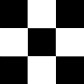

In [3]:
# Display 84x84 pixel image.
ima(filename='checkerboard_84x84.jpg') 

### 1.3 Reading Images Using OpenCV
OpenCV allows reading different types of images (JPG, PNG, etc). You can load grayscale images, color images or you can also load images with Alpha channel. It uses the **`cv2.imread()`** function which has the following syntax:

### <font color="green">Function Syntax </font>
``` python
retval = cv2.imread( filename[, flags] )
```

`retval`: Is the image if it is successfully loaded. Otherwise it is `None`. This may happen if the filename is wrong or the file is corrupt.

The function has **1 required input argument** and one optional flag:


1. `filename`: This can be an **absolute** or **relative** path. This is a **mandatory argument**.
2. `Flags`:    These flags are used to read an image in a particular format (for example, grayscale/color/with alpha channel). This is an **optional argument** with a default value of `cv2.IMREAD_COLOR` or `1` which loads the image as a color image.

Before we proceed with some examples, let's also have a look at some of the `flags` available.

**Flags**
1. **`cv2.IMREAD_GRAYSCALE`** or **`0`**: Loads image in grayscale mode
2. **`cv2.IMREAD_COLOR`** or **`1`**: Loads a color image. Any transparency of image will be neglected. It is the default flag.
3. **`cv2.IMREAD_UNCHANGED`** or **`-1`**: Loads image as such including alpha channel.


### <font color="green">OpenCV Documentation</font>

**`Imread:`**https://docs.opencv.org/4.5.1/d4/da8/group__imgcodecs.html#ga288b8b3da0892bd651fce07b3bbd3a56

**`ImreadModes:`** https://docs.opencv.org/4.5.1/d8/d6a/group__imgcodecs__flags.html#ga61d9b0126a3e57d9277ac48327799c80


In [4]:
# Read image as gray scale.
# Print the image data (pixel values), element of a 2D numpy array.
cb_img = cv2.imread("checkerboard_18x18.png",0)

# Each pixel value is 8-bits [0,255]
print(cb_img)

[[  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0

### 1.4 Display Images using Matplotlib

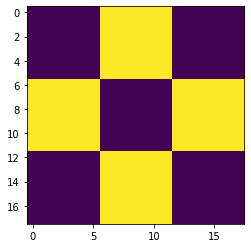

In [5]:
# Display image.
plt.imshow(cb_img)

### <i>What happened?</i>
Even though the image was read in as a gray scale image, it won't necessarily display in gray scale when using `imshow()`. matplotlib uses different color maps and it's possible that the gray scale color map is not set.

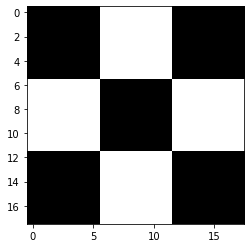

In [6]:
# Set color map to gray scale for proper rendering.
plt.imshow(cb_img, cmap='gray')

### <i>Another Example</i>

[[  0   0  15  20   1 134 233 253 253 253 255 229 130   1  29   2   0   0]
 [  0   1   5  18   0 137 232 255 254 247 255 228 129   0  24   2   0   0]
 [  7   5   2  28   2 139 230 254 255 249 255 226 128   0  27   3   2   2]
 [ 25  27  28  38   0 129 236 255 253 249 251 227 129   0  36  27  27  27]
 [  2   0   0   4   2 130 239 254 254 254 255 230 126   0   4   2   0   0]
 [132 129 131 124 121 163 211 226 227 225 226 203 164 125 125 129 131 131]
 [234 227 230 229 232 205 151 115 125 124 117 156 205 232 229 225 228 228]
 [254 255 255 251 255 222 102   1   0   0   0 120 225 255 254 255 255 255]
 [254 255 254 255 253 225 104   0  50  46   0 120 233 254 247 253 251 253]
 [252 250 250 253 254 223 105   2  45  50   0 127 223 255 251 255 251 253]
 [254 255 255 252 255 226 104   0   1   1   0 120 229 255 255 254 255 255]
 [233 235 231 233 234 207 142 106 108 102 108 146 207 235 237 232 231 231]
 [132 132 131 132 130 175 207 223 224 224 224 210 165 134 130 136 134 134]
 [  1   1   3   0   0 129

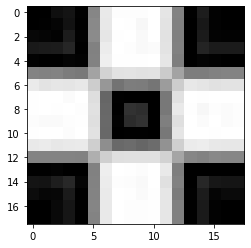

In [7]:
# Read image as gray scale.
cb_img_fuzzy = cv2.imread("checkerboard_fuzzy_18x18.jpg",0)

# print image
print(cb_img_fuzzy)

# Display image.
plt.imshow(cb_img_fuzzy,cmap='gray')

### <i>Working with Color Images</i>
Until now, we have been using gray scale images in our discussion. Let us now discuss color images.

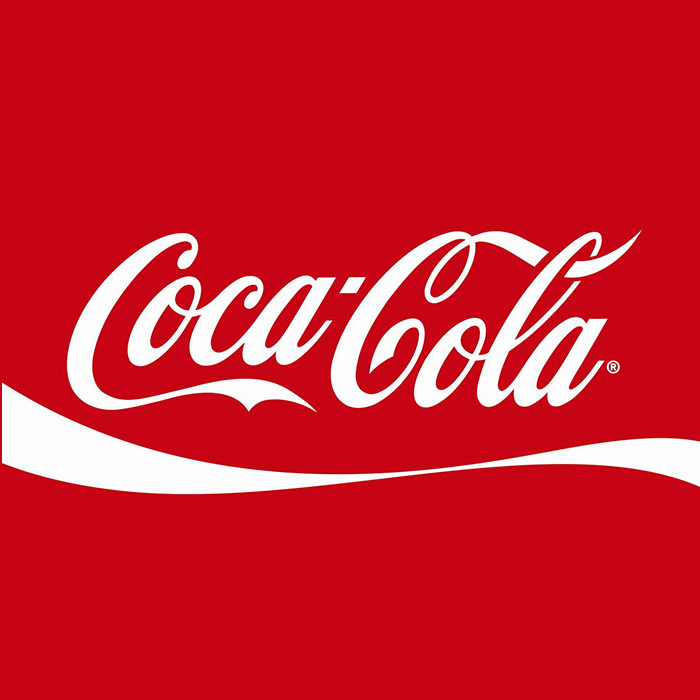

In [8]:
# Read and display Coca-Cola logo.
ima("coca-cola-logo.png")

### <i>Read and Display Color Image</i>
Let us read a color image and check the parameters. Note the image dimension.

In [9]:
# Read in image
coke_img = cv2.imread("coca-cola-logo.png",1)

# print the size of the image
print("Image size is ", coke_img.shape)

# print data-type of image
print("Data type of image is ", coke_img.dtype)
print("")

Image size is  (700, 700, 3)
Data type of image is  uint8



### <i>Display the Image</i>

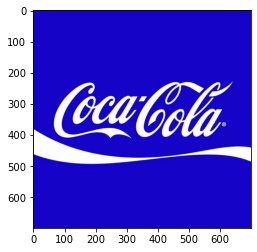

In [10]:
plt.imshow(coke_img)
# What happened?

The color displayed above is different from the actual image. This is because matplotlib expects the image in RGB format whereas OpenCV stores images in BGR format. Thus, for correct display, we need to reverse the channels of the image. We will discuss about the channels in the sections below.

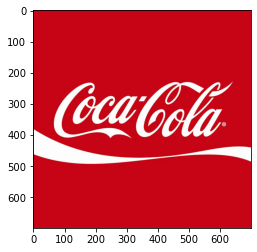

In [11]:
coke_img_channels_reversed = coke_img[:, :, ::-1]
plt.imshow(coke_img_channels_reversed)

### 1.5 Displaying Images Using OpenCV

In [12]:
cb_img = cv2.imread("checkerboard_color.png")
coke_img = cv2.imread("coca-cola-logo.png")

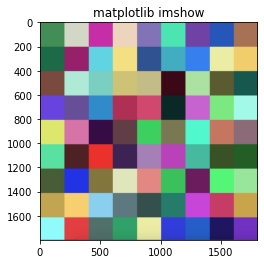

In [13]:
# Use matplotlib imshow()
plt.imshow(cb_img)
plt.title("matplotlib imshow")
plt.show()

In [14]:
# Use OpenCV imshow(), display for 8 sec
window1 = cv2.namedWindow("w1")
cv2.imshow(window1,cb_img)
cv2.waitKey(8000)
cv2.destroyWindow(window1)
cv2.destroyAllWindows()

In [15]:
# Use OpenCV imshow(), display for 8 sec
window2 = cv2.namedWindow("w2")
cv2.imshow(window2,coke_img)
cv2.waitKey(8000)
cv2.destroyWindow(window2)
cv2.destroyAllWindows()

In [16]:
# Use OpenCV imshow(), display until any key is pressed
window3 = cv2.namedWindow("w3")
cv2.imshow(window3,cb_img)
cv2.waitKey(0)
cv2.destroyWindow(window3)
cv2.destroyAllWindows()

In [17]:
# Use OpenCV imshow(), display until 'q' key is pressed
window4 = cv2.namedWindow("w4")
Alive = True
while Alive:
    cv2.imshow(window4,coke_img)
    keypress = cv2.waitKey(1)
    if keypress == ord('q'):
        Alive = False
cv2.destroyWindow(window4)
cv2.destroyAllWindows()
stop=1

### 1.6 Reading and Displaying Image Using PIL Library

In [18]:
im = Image.open("IMG_4781.JPG") # provide the correct path

In [19]:
print(im.width, im.height, im.mode, im.format, type(im))

3024 3024 RGB JPEG <class 'PIL.JpegImagePlugin.JpegImageFile'>


In [20]:
im.show() # display the image

### 1.7 Reading and Displaying Image Using imageio Library

In [21]:
im2 = imageio.imread("New_Zealand_Lake_SAVED.PNG")

In [22]:
print(type(im2), im2.shape, im2.dtype)

<class 'imageio.core.util.Array'> (600, 840, 3) uint8


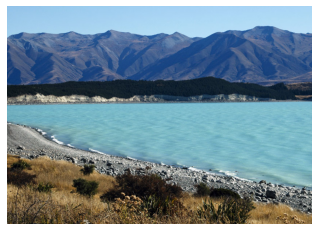

(<matplotlib.image.AxesImage at 0x283045b3460>,
 (-0.5, 839.5, 599.5, -0.5),
 None)

In [23]:
plt.imshow(im2), plt.axis('off'), plt.show()

### 1.8 Reading Image Using Matplotlib Library

In [24]:
# read the image from disk as a numpy ndarray
im2 = mping.imread("New_Zealand_Lake_SAVED.PNG")

In [25]:
print(im2.shape, im2.dtype, type(im2)) ## 3 channels (RGB image)

(600, 840, 3) float32 <class 'numpy.ndarray'>


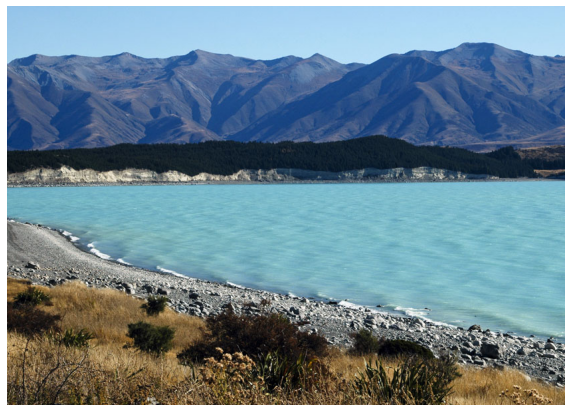

In [26]:
plt.figure(figsize=(10,10))
plt.imshow(im2) # display the image
plt.axis('off')
plt.show()

### 1.9 Read in Multiple Images from a Folder

In [27]:
images = [cv2.imread(file) for file in glob.glob("*.PNG")]

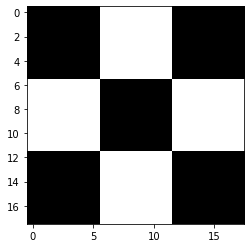

In [28]:
plt.imshow(images[0])

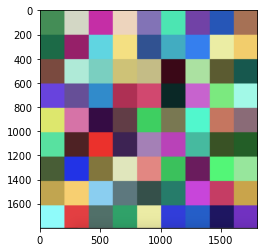

In [29]:
plt.imshow(images[1])

### 1.10 Read Files with Different Extensions

In [30]:
ext = ['JPG', 'jpg', 'PNG']    # Add image formats here
files = []
[files.extend(glob.glob('*.' + e)) for e in ext]
images2 = [cv2.imread(file) for file in files]

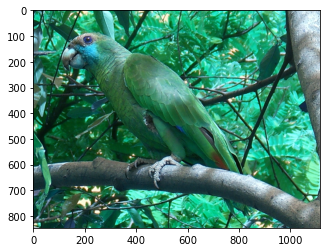

In [31]:
plt.imshow(images2[0])

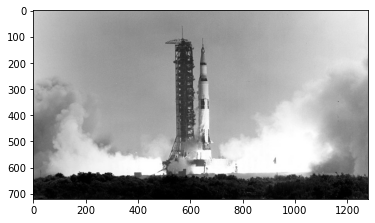

In [32]:
plt.imshow(images2[1])

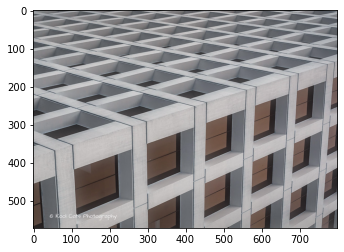

In [33]:
plt.imshow(images2[2])

## 2. Splitting and Merging Color Channels

**`cv2.split()`** Divides a multi-channel array into several single-channel arrays.

**`cv2.merge()`** Merges several arrays to make a single multi-channel array. All the input matrices must have the same size.

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

https://docs.opencv.org/4.5.1/d2/de8/group__core__array.html#ga0547c7fed86152d7e9d0096029c8518a

Text(0.5, 1.0, 'Merged Output')

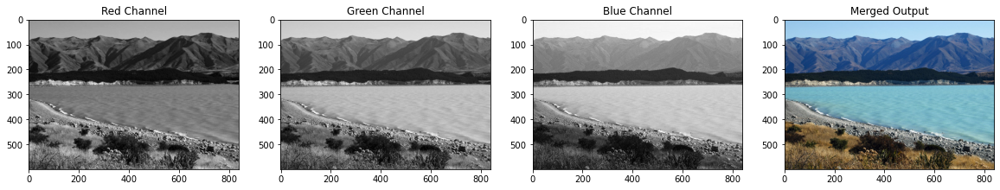

In [34]:
# Split the image into the B,G,R components
img_NZ_bgr = cv2.imread("New_Zealand_Lake.jpg",cv2.IMREAD_COLOR)
b, g, r = cv2.split(img_NZ_bgr)

# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(141)
plt.imshow(r,cmap='gray')
plt.title("Red Channel")
plt.subplot(142)
plt.imshow(g,cmap='gray')
plt.title("Green Channel")
plt.subplot(143)
plt.imshow(b,cmap='gray')
plt.title("Blue Channel")

# Merge the individual channels into a BGR image
imgMerged = cv2.merge((b,g,r))

# Show the merged output
plt.subplot(144)
plt.imshow(imgMerged[:,:,::-1])
plt.title("Merged Output")

## 3. Converting Images to Different Color Spaces

**`cv2.cvtColor()`** Converts an image from one color space to another. The function converts an input image from one color space to another. In case of a transformation to-from RGB color space, the order of the channels should be specified explicitly (RGB or BGR). Note that the default color format in OpenCV is often referred to as RGB but it is actually BGR (the bytes are reversed). So the first byte in a standard (24-bit) color image will be an 8-bit Blue component, the second byte will be Green, and the third byte will be Red. The fourth, fifth, and sixth bytes would then be the second pixel (Blue, then Green, then Red), and so on.

### <font style="color:rgb(8,133,37)">Function Syntax </font>
``` python
dst = cv2.cvtColor( src, code )
```

`dst`: Is the output image of the same size and depth as `src`.

The function has **2 required arguments**:

1. `src` input image: 8-bit unsigned, 16-bit unsigned ( CV_16UC... ), or single-precision floating-point.
2. `code` color space conversion code (see ColorConversionCodes). 

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

**`cv2.cvtColor:`** https://docs.opencv.org/3.4/d8/d01/group__imgproc__color__conversions.html#ga397ae87e1288a81d2363b61574eb8cab
**`ColorConversionCodes:`** https://docs.opencv.org/4.5.1/d8/d01/group__imgproc__color__conversions.html#ga4e0972be5de079fed4e3a10e24ef5ef0

### 3.1 Changing form BGR to RGB 

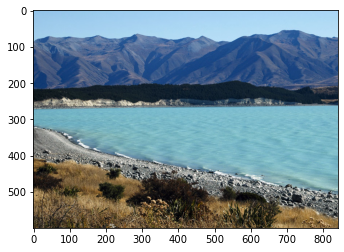

In [35]:
# OpenCV stores color channels in a differnet order than most other applications (BGR vs RGB).
img_NZ_rgb = cv2.cvtColor(img_NZ_bgr,cv2.COLOR_BGR2RGB)
plt.imshow(img_NZ_rgb)

### 3.2 Changing to HSV Color Space

Text(0.5, 1.0, 'Original')

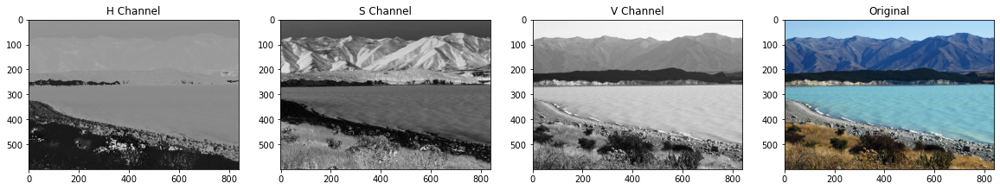

In [36]:
img_hsv = cv2.cvtColor(img_NZ_bgr, cv2.COLOR_BGR2HSV)
# Split the image into the B,G,R components
h,s,v = cv2.split(img_hsv)

# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(141)
plt.imshow(h,cmap='gray')
plt.title("H Channel")
plt.subplot(142)
plt.imshow(s,cmap='gray')
plt.title("S Channel")
plt.subplot(143)
plt.imshow(v,cmap='gray')
plt.title("V Channel")
plt.subplot(144)
plt.imshow(img_NZ_rgb)
plt.title("Original")

## 4. Modifying Individual Channel

Text(0.5, 1.0, 'Modified')

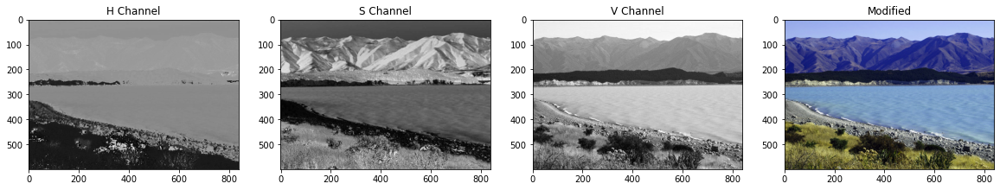

In [37]:
h_new = h+10
img_NZ_merged = cv2.merge((h_new,s,v)) 
img_NZ_rgb = cv2.cvtColor(img_NZ_merged, cv2.COLOR_HSV2RGB)

# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(141)
plt.imshow(h,cmap='gray') # write h_new instead of h for better comaprison
plt.title("H Channel")
plt.subplot(142)
plt.imshow(s,cmap='gray')
plt.title("S Channel");
plt.subplot(143)
plt.imshow(v,cmap='gray')
plt.title("V Channel")
plt.subplot(144)
plt.imshow(img_NZ_rgb)
plt.title("Modified")

## 5. Saving Images

Saving the image is as trivial as reading an image in OpenCV. We use the function **`cv2.imwrite()`** with two arguments. The first one is the filename, second argument is the image object.

The function imwrite saves the image to the specified file. The image format is chosen based on the filename extension (see cv::imread for the list of extensions). In general, only 8-bit single-channel or 3-channel (with 'BGR' channel order) images can be saved using this function (see the OpenCV documentation for further details).

	
### <font style="color:rgb(8,133,37)">Function Syntax </font>
``` python
cv2.imwrite( filename, img[, params] )
```

The function has **2 required arguments**:

1. `filename`: This can be an **absolute** or **relative** path. 
2. `img`: Image or Images to be saved.

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

**`Imwrite:`** https://docs.opencv.org/4.5.1/d4/da8/group__imgcodecs.html#gabbc7ef1aa2edfaa87772f1202d67e0ce
**`ImwriteFlags:`**https://docs.opencv.org/4.5.1/d8/d6a/group__imgcodecs__flags.html#ga292d81be8d76901bff7988d18d2b42ac

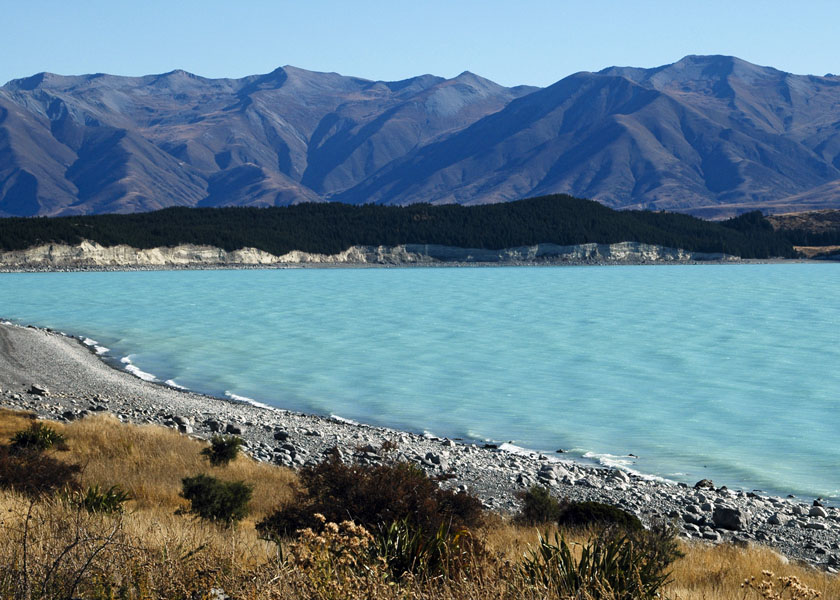

In [38]:
# save the image
cv2.imwrite("New_Zealand_Lake_SAVED.png",img_NZ_bgr)
ima(filename='New_Zealand_Lake_SAVED.png') 

In [39]:
# read the image as Color
img_NZ_bgr = cv2.imread("New_Zealand_Lake_SAVED.png", cv2.IMREAD_COLOR)
print("img_NZ_bgr shape is: ", img_NZ_bgr.shape)

# read the image as Grayscaled
img_NZ_gry = cv2.imread("New_Zealand_Lake_SAVED.png", cv2.IMREAD_GRAYSCALE)
print("img_NZ_gry shape is: ", img_NZ_gry.shape)

img_NZ_bgr shape is:  (600, 840, 3)
img_NZ_gry shape is:  (600, 840)


## 6.  Basic Image Manipulations

### 6.1 Accessing Image Pixels
Let us see how to access a pixel in the image.

For accessing any pixel in a numpy matrix, you have to use matrix notation such as matrix[r,c], where the r is the row number and c is the column number. Also note that the matrix is 0-indexed. 

For example, if you want to access the first pixel, you need to specify matrix[0,0]. Let us see with some examples. We will print one black pixel from top-left and one white pixel from top-center.

[[  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0

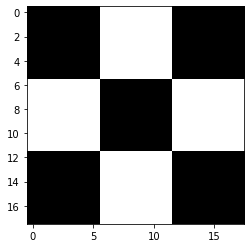

In [40]:
# Read image as gray scale.
cb_img = cv2.imread("checkerboard_18x18.png",0)

# Set color map to gray scale for proper rendering.
plt.imshow(cb_img, cmap='gray')
print(cb_img)

In [41]:
# print the first pixel of the first black box
print(cb_img[0,0])
# print the first white pixel to the right of the first black box
print(cb_img[0,6])

0
255


### 6.2 Modifying Image Pixels
We can modify the intensity values of pixels in the same manner as described above.

[[  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0 200 200   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0 200 200   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [255 255 255 255 255 255   0   0   0   0   0   0 255 255 255 255 255 255]
 [  0   0   0   0   0   0 255 255 255 255 255 255   0   0   0   0   0   0]
 [  0   0   0   0   0   0

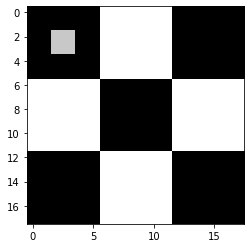

In [42]:
cb_img_copy = cb_img.copy()
cb_img_copy[2,2] = 200
cb_img_copy[2,3] = 200
cb_img_copy[3,2] = 200
cb_img_copy[3,3] = 200

# Same as above
# cb_img_copy[2:3,2:3] = 200

plt.imshow(cb_img_copy,cmap='gray')
print(cb_img_copy)

### 6.3 Cropping Images
Cropping an image is simply achieved by selecting a specific (pixel) region of the image. 

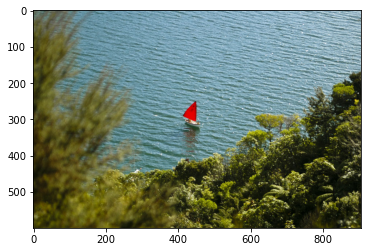

In [43]:
img_NZ_bgr = cv2.imread("New_Zealand_Boat.jpg",cv2.IMREAD_COLOR)
img_NZ_rgb = img_NZ_bgr[:,:,::-1] 

plt.imshow(img_NZ_rgb)

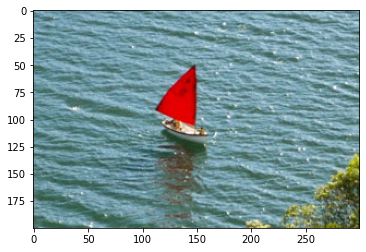

In [44]:
# crop out the middle region of the image
cropped_region = img_NZ_rgb[200:400,300:600]
plt.imshow(cropped_region)

### 6.4 Resizing Images (Using OpenCV)

The function **`resize`** resizes the image `src` down to or up to the specified size. The size and type are derived from the `src`,`dsize`,`fx`, and `fy`.

### <font style="color:rgb(8,133,37)">Function Syntax </font>
``` python
dst = resize( src, dsize[, dst[, fx[, fy[, interpolation]]]] )
```

`dst`: output image; it has the size dsize (when it is non-zero) or the size computed from src.size(), fx, and fy; the type of dst is the same as of src.

The function has **2 required arguments**:
    
1. `src`:	input image
2. `dsize`: output image size

Optional arguments that are often used include:

1. `fx`: Scale factor along the horizontal axis; when it equals 0, it is computed as (𝚍𝚘𝚞𝚋𝚕𝚎)𝚍𝚜𝚒𝚣𝚎.𝚠𝚒𝚍𝚝𝚑/𝚜𝚛𝚌.𝚌𝚘𝚕𝚜
2. `fy`: Scale factor along the vertical axis; when it equals 0, it is computed as (𝚍𝚘𝚞𝚋𝚕𝚎)𝚍𝚜𝚒𝚣𝚎.𝚑𝚎𝚒𝚐𝚑𝚝/𝚜𝚛𝚌.𝚛𝚘𝚠𝚜

The output image has the size `dsize` (when it is non-zero) or the size computed from `src.size()`, `fx`, and `fy`; the type of dst is the same as of src.

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

**`resize():`** https://docs.opencv.org/4.5.0/da/d54/group__imgproc__transform.html#ga47a974309e9102f5f08231edc7e7529d

### <font color="green"> Method 1: Specifying Scaling Factor using fx and fy

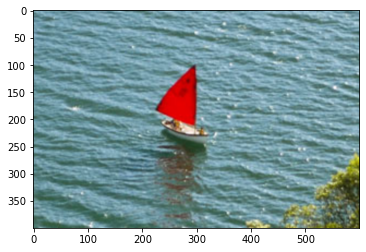

In [45]:
resized_cropped_region_2x = cv2.resize(cropped_region,None,fx=2,fy=2)
plt.imshow(resized_cropped_region_2x)

### <font color="green">Medthod 2: Specifying Exact Size of the Output Image</font>

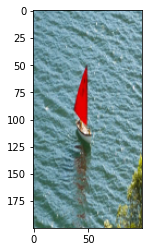

In [46]:
desired_width = 100
desired_height = 200
dim = (desired_width,desired_height)

# Resize background image to see size as logo image
resized_cropped_region = cv2.resize(cropped_region,dsize=dim,interpolation=cv2.INTER_AREA)
plt.imshow(resized_cropped_region)

### <font color="green">Resize While Maintaining Aspect Ratio</font>

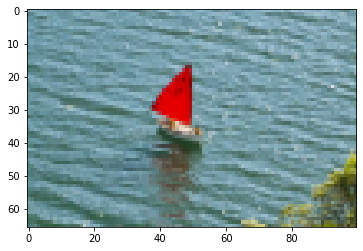

In [47]:
# Method 2: Using 'dsize'
desired_width = 100
aspect_ratio = desired_width/cropped_region.shape[1]
desired_height = int(cropped_region.shape[0] * aspect_ratio)
dim = (desired_width,desired_height)

# Resize image
resize_cropped_region = cv2.resize(cropped_region,dsize=dim,interpolation=cv2.INTER_AREA)
plt.imshow(resize_cropped_region)

### <font style="color:rgb(8,133,37)">Example - Let's actually show the (cropped) resized image.</font>

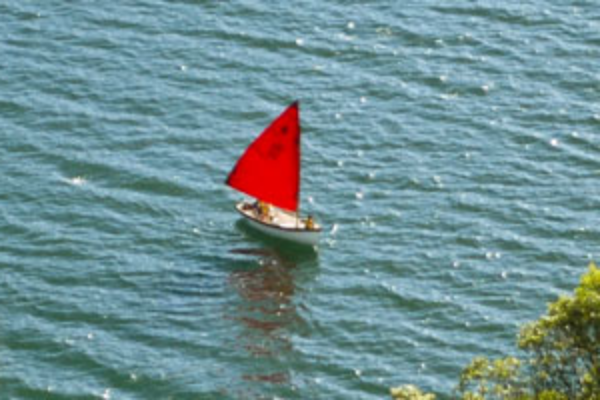

In [48]:
# swap the channel order 
resized_cropped_region_2x = resized_cropped_region_2x[:,:,::-1]

# save and resized image to disk
cv2.imwrite("resized_cropped_region_2x.png", resized_cropped_region_2x)

# Display the cropped and resized image
ima(filename='resized_cropped_region_2x.png')

### <font style="color:rgb(8,133,37)">Image Resizing Using PIL Library</font>

In [49]:
import matplotlib.pylab as pylab
im = Image.open('IMG_4781.JPG')
im.show() # display the image 

### <i>Increase the Size of the Image / Upsampling - Using Interpolation Method</i>

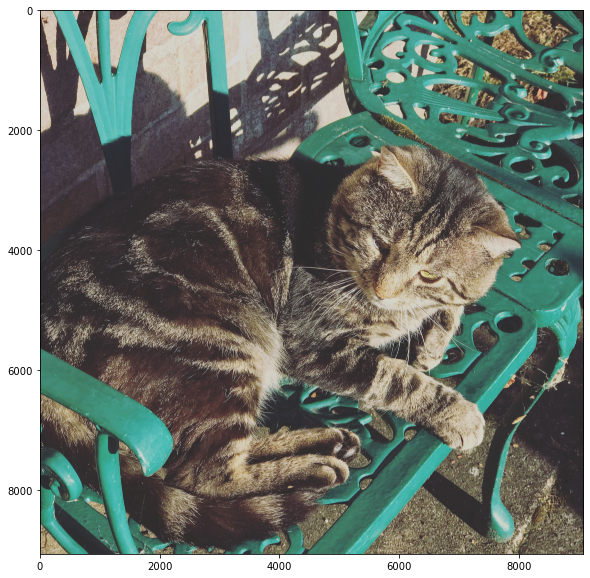

(<Figure size 720x720 with 1 Axes>,
 None)

In [50]:
# using nearest neighbour interpolation
imu = im.resize((im.width*3,im.height*3),Image.NEAREST) 
pylab.figure(figsize=(10,10)), pylab.imshow(imu), pylab.show()

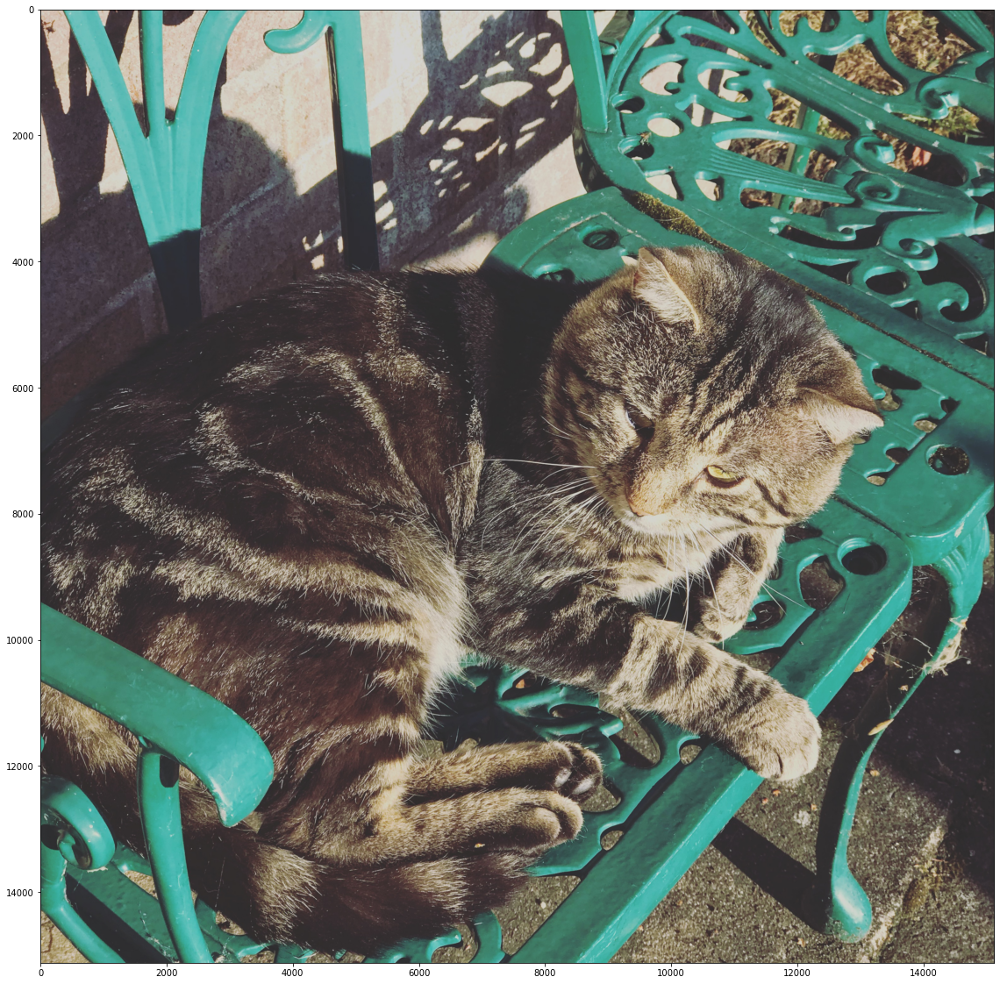

(<Figure size 1440x1440 with 1 Axes>,
 None)

In [51]:
# up-sample with bi-linear interpolation
im1 = im.resize((im.width*5, im.height*5), Image.BILINEAR) 
pylab.figure(figsize=(20,20)), pylab.imshow(im1), pylab.show()

### <i>Downsampling - Reduce Height and Width by a Factor</i>

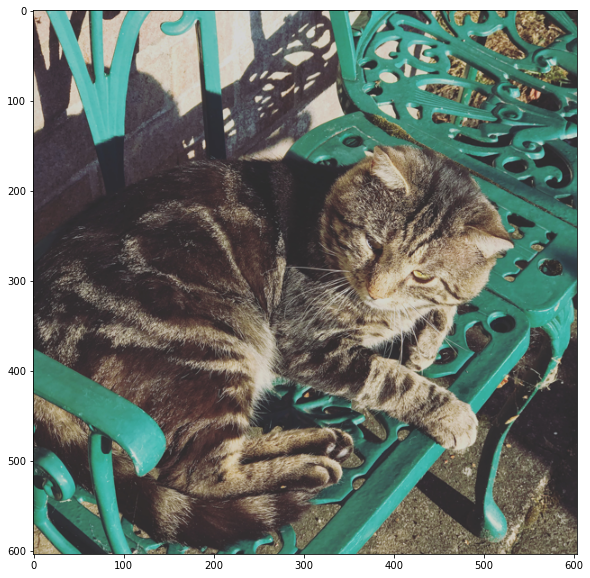

(<Figure size 1080x720 with 1 Axes>,
 None)

In [52]:
im = im.resize((im.width//5,im.height//5))
pylab.figure(figsize=(15,10)), pylab.imshow(im), pylab.show()

### 6.5 Flipping Images


The function **`flip`** flips the array in one of three different ways (row and column indices are 0-based):

### <font style="color:rgb(8,133,37)">Function Syntax </font>
``` python
dst = cv.flip( src, flipCode )
```

`dst`: output array of the same size and type as src.

The function has **2 required arguments**:
    
1. `src`:	input image
2. `flipCode`: a flag to specify how to flip the array; 0 means flipping around the x-axis and positive value (for example, 1) means flipping around y-axis. Negative value (for example, -1) means flipping around both axes.


### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

**`flip:`** https://docs.opencv.org/4.5.0/d2/de8/group__core__array.html#gaca7be533e3dac7feb70fc60635adf441

Text(0.5, 1.0, 'Original')

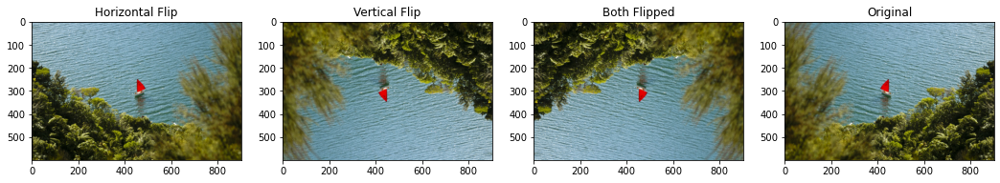

In [53]:
img_NZ_rgb_flipped_horz = cv2.flip(img_NZ_rgb,1)
img_NZ_rgb_flipped_vert = cv2.flip(img_NZ_rgb,0)
img_NZ_rgb_flipped_both = cv2.flip(img_NZ_rgb,-1)

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(141)
plt.imshow(img_NZ_rgb_flipped_horz)
plt.title("Horizontal Flip")
plt.subplot(142)
plt.imshow(img_NZ_rgb_flipped_vert)
plt.title("Vertical Flip")
plt.subplot(143)
plt.imshow(img_NZ_rgb_flipped_both)
plt.title("Both Flipped")
plt.subplot(144)
plt.imshow(img_NZ_rgb)
plt.title("Original")

## 7. Basic Image Annotations

In this topic, we will learn about image annotation using OpenCV. We will learn how to peform the following annotations to images.

* Draw lines 
* Draw circles
* Draw rectangles
* Add text

These are useful when you want to annotate your results for presentations or show a demo of your application. Annotations can also be useful during development and debugging.

### <font style="color:black">7.1 Drawing a Line</font>


Let's start off by drawing a line on an image. We will use cv2.line function for this.

### <font style="color:rgb(8,133,37)">Function Syntx</font>
``` python
    img = cv2.line(img, pt1, pt2, color[, thickness[, lineType[, shift]]])
```

`img`: The output image that has been annotated.

The function has **4 required arguments**:

1. `img`:   Image on which we will draw a line
2. `pt1`:   First point(x,y location) of the line segment
3. `pt2`:   Second point of the line segment
4. `color`: Color of the line which will be drawn
    
Other optional arguments that are important for us to know include:

1. `thickness`: Integer specifying the line thickness. Default value is 1.
2. `lineType`:  Type of the line. Default value is 8 which stands for an 8-connected line. Usually, cv2.LINE_AA (antialiased or smooth line) is used for the lineType.
    
### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

**`line:`**https://docs.opencv.org/4.5.1/d6/d6e/group__imgproc__draw.html#ga7078a9fae8c7e7d13d24dac2520ae4a2

Let's see an example of this.

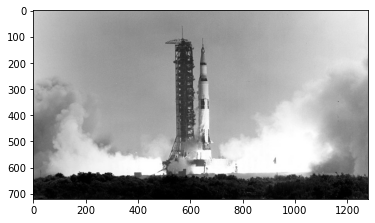

In [54]:
# Read in an image
image = cv2.imread("Apollo_11_Launch.jpg", cv2.IMREAD_COLOR)

# Display the original image
plt.imshow(image[:,:,::-1])

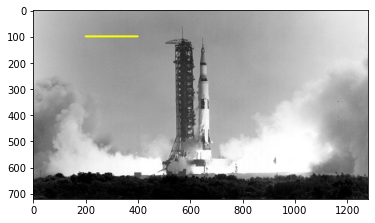

In [55]:
imageLine = image.copy()

# The line starts from (200,100) and ends at (400,100)
# The color of the line is YELLOW (Recall that OpenCV uses BGR format)
# Thickness of line is 5px
# Linetype is cv2.LINE_AA

cv2.line(imageLine,(200,100),(400,100),(0,255,255),thickness=5,lineType=cv2.LINE_AA)

# Display the image
plt.imshow(imageLine[:,:,::-1])

### <font style="color:black">7.2 Drawing a Circle</font>


Let's start off by drawing a circle on an image. We will use cv2.circle function for this.

### <font style="color:rgb(8,133,37)">Functional syntx</font>
``` python
img = cv2.circle(img, center, radius, color[, thickness[, lineType[, shift]]])
```

`img`: The output image that has been annotated.

The function has **4 required arguments**:

1. `img`:    Image on which we will draw a line
2. `center`: Center of the circle
3. `radius`: Radius of the circle
4. `color`:  Color of the circle which will be drawn
    
Next, let's check out the (optional) arguments which we are going to use quite extensively.

1. `thickness`: Thickness of the circle outline (if positive). 
If a negative value is supplied for this argument, it will result in a filled circle.
2. `lineType`:  Type of the circle boundary. This is exact same as lineType argument in **cv2.line**
    
### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>
    
**`circle:`** https://docs.opencv.org/4.5.1/d6/d6e/group__imgproc__draw.html#gaf10604b069374903dbd0f0488cb43670

Let's see an example of this.

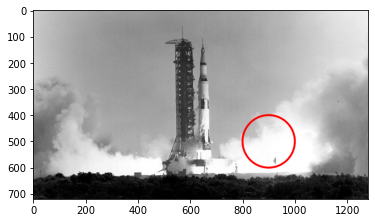

In [56]:
# Draw a circle 
imageCircle = image.copy()

cv2.circle(imageCircle,(900,500),100,(0,0,255),thickness=5,lineType=cv2.LINE_AA)

# Display the image
plt.imshow(imageCircle[:,:,::-1])

### <font style="color:black">7.3 Drawing a Rectangle</font>


We will use **cv2.rectangle** function to draw a rectangle on an image. The function syntax is as follows.

### <font style="color:rgb(8,133,37)">Functional syntx</font>

    img = cv2.rectangle(img, pt1, pt2, color[, thickness[, lineType[, shift]]])

`img`: The output image that has been annotated.

The function has **4 required arguments**:

1. `img`: Image on which the rectangle is to be drawn.
2. `pt1`: Vertex of the rectangle. Usually we use the **top-left vertex** here.
3. `pt2`: Vertex of the rectangle opposite to pt1. Usually we use the **bottom-right**              vertex here.
4. `color`: Rectangle color
    
Next, let's check out the (optional) arguments which we are going to use quite extensively.

1. `thickness`: Thickness of the circle outline (if positive). 
    If a negative value is supplied for this argument, it will result in a filled rectangle.
2. `lineType`: Type of the circle boundary. This is exact same as lineType argument in 
    **cv2.line**
### <font style="color:rgb(8,133,37)">OpenCV Documentation Links</font>

**`rectangle:`**https://docs.opencv.org/4.5.1/d6/d6e/group__imgproc__draw.html#ga07d2f74cadcf8e305e810ce8eed13bc9
    
Let's see an example of this.

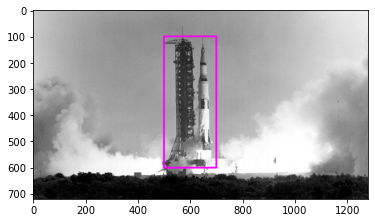

In [57]:
# Draw a rectangle (thickness is a positive integer)
imageRectangle = image.copy()

cv2.rectangle(imageRectangle,(500,100),(700,600),(255,0,255),thickness=5,lineType=cv2.LINE_8)

# Display the image
plt.imshow(imageRectangle[:,:,::-1])

### <font style="color:black">7.4 Adding Text</font>


Finally, let's see how we can write some text on an image using **cv2.putText** function.

### <font style="color:rgb(8,133,37)">Functional syntx</font>

    img = cv2.putText(img, text, org, fontFace, fontScale, color[, thickness[, lineType[, bottomLeftOrigin]]])

`img`: The output image that has been annotated.

The function has **6 required arguments**:

1. `img`: Image on which the text has to be written.
2. `text`: Text string to be written.
3. `org`: Bottom-left corner of the text string in the image.
4. `fontFace`: Font type
5. `fontScale`: Font scale factor that is multiplied by the font-specific base size.
6. `color`: Font color
 
Other optional arguments that are important for us to know include:

1. `thickness`: Integer specifying the line thickness for the text. Default value is 1.
2. `lineType`: Type of the line. Default value is 8 which stands for an 8-connected line. Usually, cv2.LINE_AA (antialiased or smooth line) is used for the lineType.

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

**`putText:`**https://docs.opencv.org/4.5.1/d6/d6e/group__imgproc__draw.html#ga5126f47f883d730f633d74f07456c576
    
Let's see an example of this.

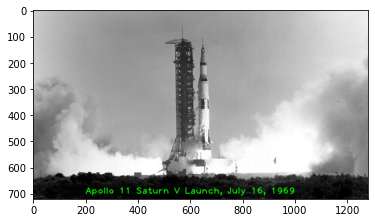

In [58]:
imageText = image.copy()
text = "Apollo 11 Saturn V Launch, July 16, 1969"
fontScale = 2.3
fontFace = cv2.FONT_HERSHEY_PLAIN
fontColor = (0,255,0)
fontThickness = 2

cv2.putText(imageText,text,(200,700),fontFace,fontScale,fontColor,fontThickness,cv2.LINE_AA)

# Display the image
plt.imshow(imageText[:,:,::-1])

## 8. Basic Image Enhancement Using Mathematical Operations
Image Processing techniques take advantage of mathematical operations to achieve different results. Most often we arrive at an enhanced version of the image using some basic operations. We will take a look at some of the fundamental operations often used in computer vision pipelines. In this notebook we will cover:

* Arithmetic Operations like addition, multiplication
* Thresholding & Masking
* Bitwise Operations like OR, AND, XOR

### 8.1 Addition or Brightness
The first operation we discuss is simple addition of images. This results in increasing or decreasing the brightness of the image since we are eventually increasing or decreasing the intensity values of each pixel by the same amount. So, this will result in a global increase/decrease in brightness.

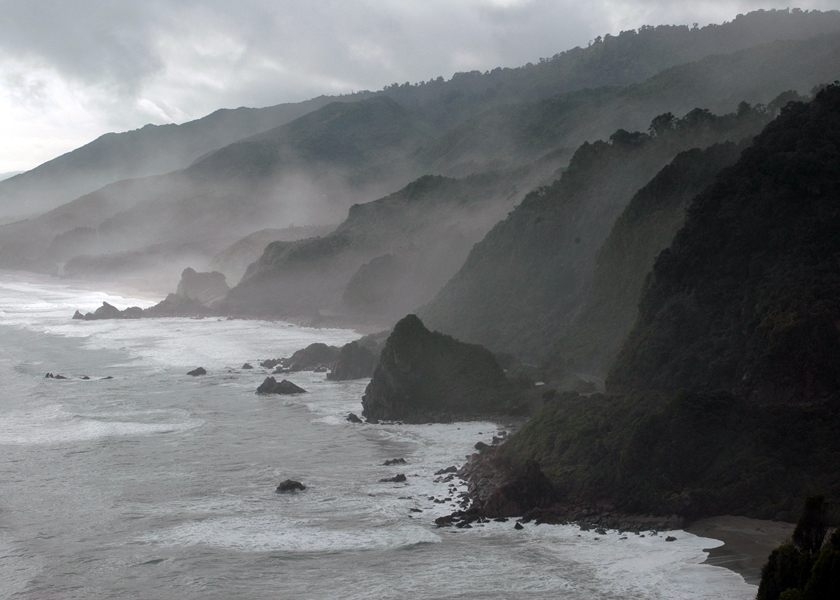

In [59]:
img_bgr = cv2.imread("New_Zealand_Coast.jpg",cv2.IMREAD_COLOR)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Display 18x18 pixel image.
ima(filename='New_Zealand_Coast.jpg')

Text(0.5, 1.0, 'Brighter')

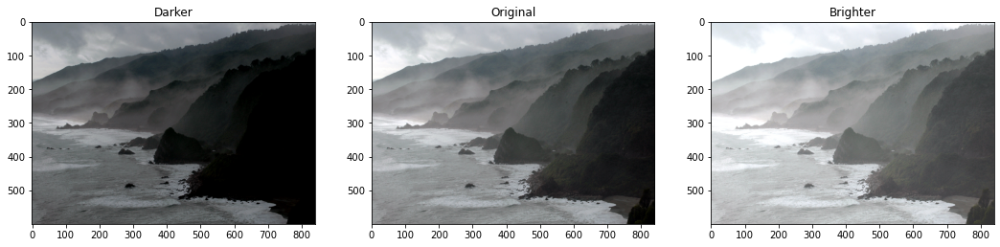

In [60]:
matrix = np.ones(img_rgb.shape,dtype='uint8')*50

img_rgb_brighter = cv2.add(img_rgb,matrix)
img_rgb_darker = cv2.subtract(img_rgb,matrix)

# Show the image
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(img_rgb_darker)
plt.title("Darker")
plt.subplot(132)
plt.imshow(img_rgb)
plt.title("Original")
plt.subplot(133)
plt.imshow(img_rgb_brighter)
plt.title("Brighter")

### 8.2 Multiplication or Contrast
Just like addition can result in brightness change, multiplication can be used to improve the contrast of the image. 

Contrast is the difference in the intensity values of the pixels of an image. Multiplying the intensity values with a constant can make the difference larger or smaller ( if multiplying factor is < 1 ).

Text(0.5, 1.0, 'Higher Contrast')

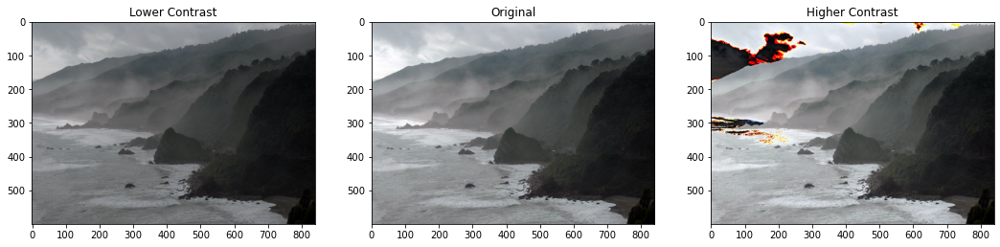

In [61]:
matrix1 = np.ones(img_rgb.shape) * .8
matrix2 = np.ones(img_rgb.shape) * 1.2

img_rgb_darker = np.uint8(cv2.multiply(np.float64(img_rgb),matrix1))
img_rgb_brighter = np.uint8(cv2.multiply(np.float64(img_rgb),matrix2))

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(img_rgb_darker)
plt.title("Lower Contrast")
plt.subplot(132)
plt.imshow(img_rgb)
plt.title("Original")
plt.subplot(133)
plt.imshow(img_rgb_brighter)
plt.title("Higher Contrast")

### <font color="green">What happened?</font>
Can you see the weird colors in some areas of the image after multiplication?

The issue is that after multiplying, the values which are already high, are becoming greater than 255. Thus, the overflow issue. How do we overcome this?

### <font color="green">Handling Overflow using np.clip</font>

Text(0.5, 1.0, 'Higher Contrast')

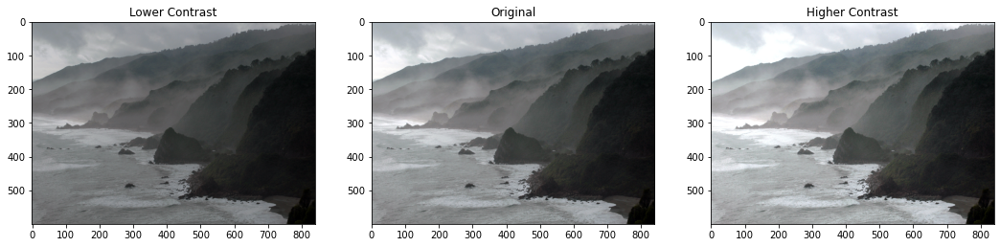

In [62]:
matrix1 = np.ones(img_rgb.shape) * .8
matrix2 = np.ones(img_rgb.shape) * 1.2

img_rgb_darker = np.uint8(cv2.multiply(np.float64(img_rgb),matrix1))
img_rgb_brighter = np.uint8(np.clip(cv2.multiply(np.float64(img_rgb),matrix2),0,255))

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(img_rgb_darker)
plt.title("Lower Contrast")
plt.subplot(132)
plt.imshow(img_rgb)
plt.title("Original")
plt.subplot(133)
plt.imshow(img_rgb_brighter)
plt.title("Higher Contrast")

### 8.3 Image Thresholding
Binary Images have a lot of use cases in Image Processing. One of the most common use cases is that of creating masks. Image Masks allow us to process on specific parts of an image keeping the other parts intact. Image Thresholding is used to create Binary Images from grayscale images. You can use different thresholds to create different binary images from the same original image. 

### <font color="green">Function Syntax </font>

``` python
retval, dst = cv2.threshold( src, thresh, maxval, type[, dst] )
```

`dst`: The output array of the same size and type and the same number of channels as `src`.

The function has **4 required arguments**:

1. `src`: input array (multiple-channel, 8-bit or 32-bit floating point).
2. `thresh`: threshold value.
3. `maxval`: maximum value to use with the THRESH_BINARY and THRESH_BINARY_INV thresholding types.
4. `type`: thresholding type (see ThresholdTypes).


### <font color="green">Function Syntax </font>

``` python
dst = cv.adaptiveThreshold( src, maxValue, adaptiveMethod, thresholdType, blockSize, C[, dst] )
```

`dst`	Destination image of the same size and the same type as src.

The function has **6 required arguments**:
1. `src`:	Source 8-bit single-channel image.

2. `maxValue`:	Non-zero value assigned to the pixels for which the condition is satisfied
3. `adaptiveMethod`:	Adaptive thresholding algorithm to use, see AdaptiveThresholdTypes. The BORDER_REPLICATE | BORDER_ISOLATED is used to process boundaries.
4. `thresholdType:`	Thresholding type that must be either THRESH_BINARY or THRESH_BINARY_INV, see ThresholdTypes.
5. `blockSize`:	Size of a pixel neighborhood that is used to calculate a threshold value for the pixel: 3, 5, 7, and so on.
6. `C`:	Constant subtracted from the mean or weighted mean (see the details below). Normally, it is positive but may be zero or negative as well.

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

https://docs.opencv.org/4.5.1/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57
https://docs.opencv.org/4.5.1/d7/d4d/tutorial_py_thresholding.html

(572, 800)


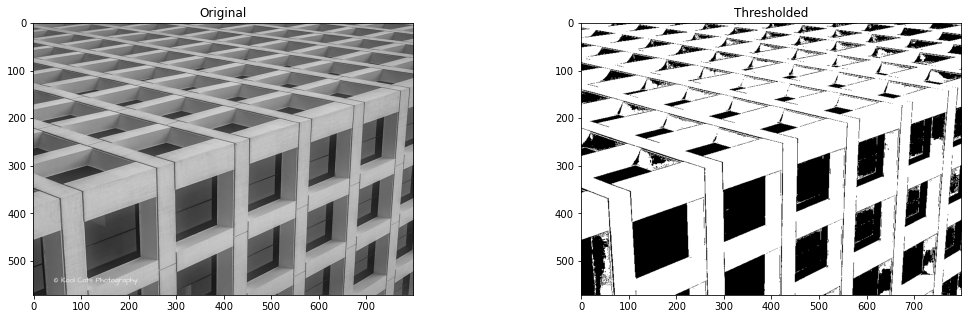

In [63]:
img_read = cv2.imread("building-windows.jpg", cv2.IMREAD_GRAYSCALE)
retval, img_thresh = cv2.threshold(img_read,100,255,cv2.THRESH_BINARY)

# Show the images 
plt.figure(figsize=[18,5])
plt.subplot(121); plt.imshow(img_read, cmap="gray");         plt.title("Original");
plt.subplot(122); plt.imshow(img_thresh, cmap="gray");       plt.title("Thresholded");

print(img_thresh.shape)

### <i>Application: Sheet Music Reader</i> 
Suppose you wanted to build an application that could read (decode) sheet music. This is similar to 
Optical Character Recognigition (OCR) for text documents where the goal is to recognize text characters. In either application, one of the first steps in the processing pipeline is to isolate the important information in the image of a document (separating it from the background). This task can be accomplished with thresholding 
techniques. Let's take a look at an example.

Text(0.5, 1.0, 'Thresholded (adaptive)')

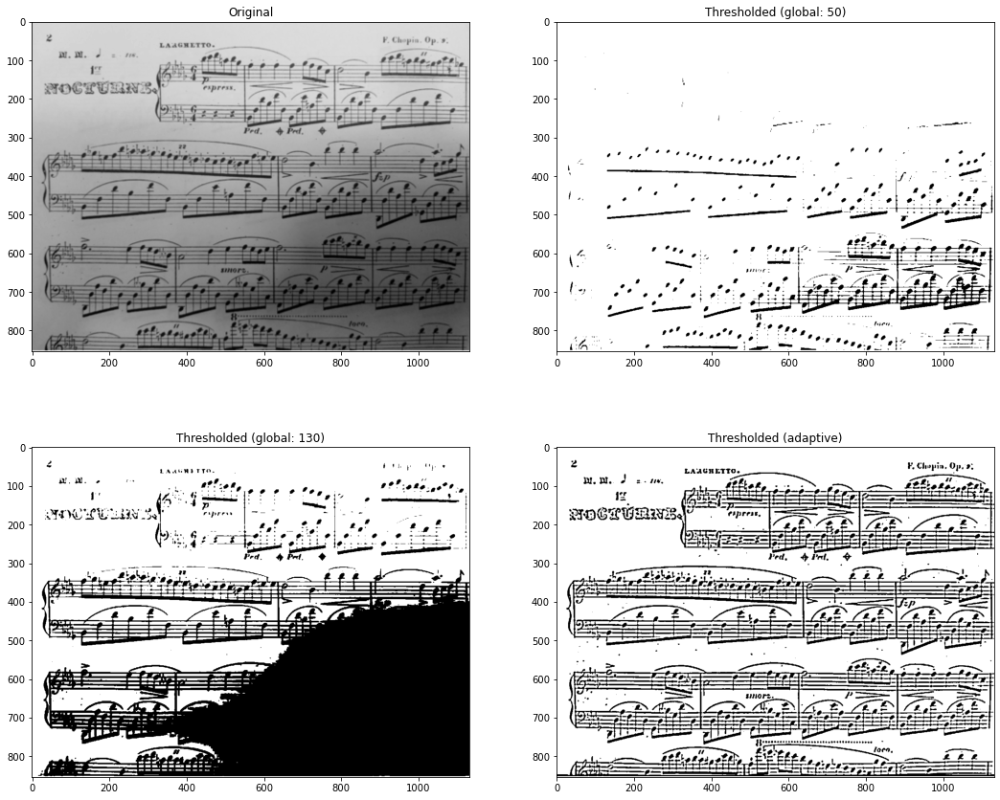

In [64]:
# Read the original image
img_read = cv2.imread("Piano_Sheet_Music.png", cv2.IMREAD_GRAYSCALE)

# Perform global thresholding
retval, img_thresh_gbl_1 = cv2.threshold(img_read,50,255,cv2.THRESH_BINARY) 

# Perform global thresholding
retval, img_thresh_gbl_2 = cv2.threshold(img_read,130,255,cv2.THRESH_BINARY)

# Perform adaptive thresholding
img_thresh_adp = cv2.adaptiveThreshold(img_read,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,7)

# Show the images
plt.figure(figsize=[18,15])
plt.subplot(221)
plt.imshow(img_read,cmap="gray")
plt.title("Original")
plt.subplot(222)
plt.imshow(img_thresh_gbl_1,cmap="gray")
plt.title("Thresholded (global: 50)")
plt.subplot(223)
plt.imshow(img_thresh_gbl_2,cmap="gray")
plt.title("Thresholded (global: 130)")
plt.subplot(224)
plt.imshow(img_thresh_adp,cmap="gray")
plt.title("Thresholded (adaptive)")

### 8.4 Bitwise Operations

### <font style="color:rgb(8,133,37)">Function Syntax</font>

Example API for `cv2.bitwise_and()`. Others include: `cv2.bitwise_or()`, `cv2.bitwise_xor()`, `cv2.bitwise_not()`

``` python
dst = cv2.bitwise_and( src1, src2[, dst[, mask]] )
```

`dst`: Output array that has the same size and type as the input arrays.

The function has **2 required arguments**:

1. `src1`:	first input array or a scalar.
2. `src2`:	second input array or a scalar.

An important optional argument is:

1. `mask`:	optional operation mask, 8-bit single channel array, that specifies elements of the output array to be changed.


### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

https://docs.opencv.org/4.5.1/d0/d86/tutorial_py_image_arithmetics.html
https://docs.opencv.org/4.5.0/d2/de8/group__core__array.html#ga60b4d04b251ba5eb1392c34425497e14

(200, 499)


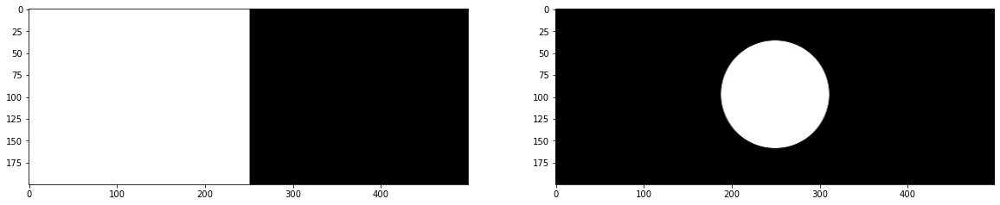

In [65]:
img_rec = cv2.imread("rectangle.jpg", cv2.IMREAD_GRAYSCALE)

img_cir = cv2.imread("circle.jpg", cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=[20,5])
plt.subplot(121);plt.imshow(img_rec,cmap='gray')
plt.subplot(122);plt.imshow(img_cir,cmap='gray')
print(img_rec.shape)

### <font color="green">Bitwise AND Operator </font>

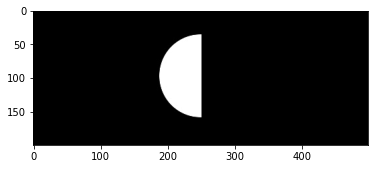

In [66]:
result = cv2.bitwise_and(img_rec,img_cir,mask=None)
plt.imshow(result,cmap='gray')

### <font color="green">Bitwise OR Operator </font>

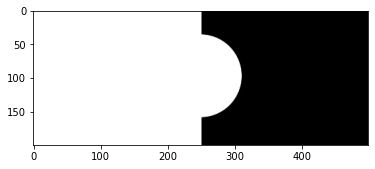

In [67]:
result = cv2.bitwise_or(img_rec,img_cir,mask=None)
plt.imshow(result,cmap='gray')

### <font color="green">Bitwise XOR Operator </font>

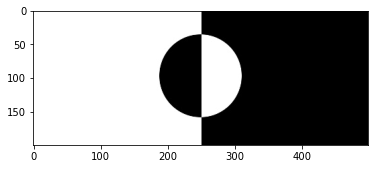

In [68]:
result = cv2.bitwise_xor(img_rec,img_cir,mask=None)
plt.imshow(result,cmap='gray')

### <i>Application: Logo Manipulation</i>

In this section we will show you how to fill in the white lettering of the Coca-Cola logo below with a background image.

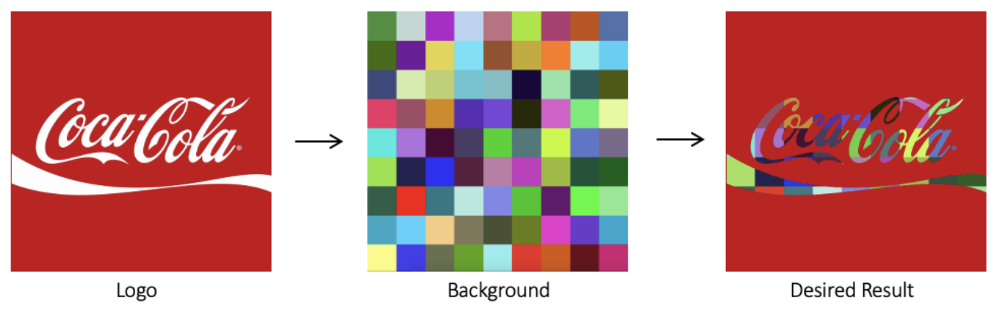

In [69]:
ima(filename='Logo_Manipulation.png')

### <font color="green">Read Foreground Image</font>

(700, 700, 3)


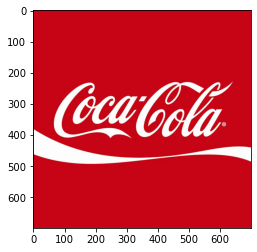

In [70]:
img_bgr = cv2.imread("coca-cola-logo.png")
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
print(img_rgb.shape)
logo_w = img_rgb.shape[0]
logo_h = img_rgb.shape[1]

### <font color="green">Read Background image</font>

(700, 700, 3)


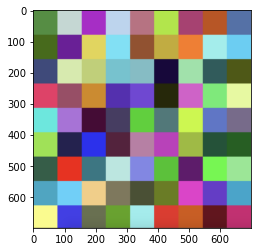

In [71]:
# Read in image of color cheackerboad background
img_background_bgr = cv2.imread("checkerboard_color.png")
img_background_rgb = cv2.cvtColor(img_background_bgr, cv2.COLOR_BGR2RGB)

# Set desired width (logo_w) and maintain image aspect ratio
aspect_ratio = logo_w / img_background_rgb.shape[1]
dim = (logo_w,int(img_background_rgb.shape[0]*aspect_ratio))

# Resize background image to sae size as logo image
img_background_rgb = cv2.resize(img_background_rgb,dim,interpolation=cv2.INTER_AREA)

plt.imshow(img_background_rgb) 
print(img_background_rgb.shape)

### <font color="green">Create Mask for Original Image</font>

(700, 700)


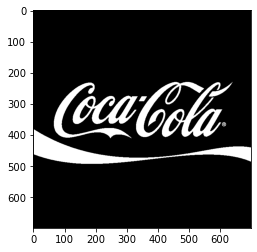

In [72]:
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# Apply global thresholding to creat a binary mask of the logo
retval, img_mask = cv2.threshold(img_gray,127,255,cv2.THRESH_BINARY)

plt.imshow(img_mask,cmap="gray")
print(img_mask.shape)

### <font color="green">Invert the Mask </font>

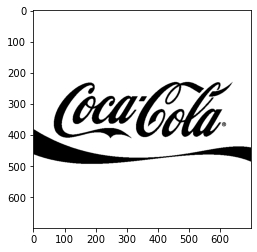

In [73]:
# Create an inverse mask
img_mask_inv = cv2.bitwise_not(img_mask)
plt.imshow(img_mask_inv,cmap="gray")

### <font color="green">Apply Background on the Mask</font>

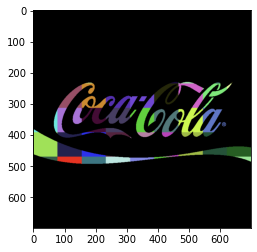

In [74]:
# Create colorful background "behind" the logo lettering
img_background = cv2.bitwise_and(img_background_rgb, img_background_rgb, mask=img_mask)
plt.imshow(img_background)

### <font color="green">Isolate Foreground from Image</font>

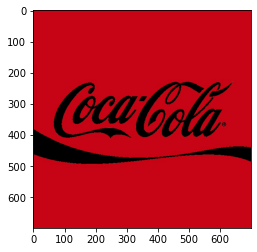

In [75]:
# Create colorful background "behind" the logo lettering
img_foreground = cv2.bitwise_and(img_rgb, img_rgb, mask=img_mask_inv)
plt.imshow(img_foreground)

### <font color="green">Result: Merge Foreground and Background</font>

True

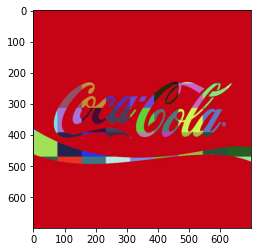

In [76]:
# Add the two previous results obtain the final result
result = cv2.add(img_background,img_foreground)
plt.imshow(result)
cv2.imwrite("logo_final.png", result[:,:,::-1])

# The End of Chapter 1 !!!